# Homework 3: Computer Vision

**Overview**: In HW3 you will get familiarized with many techniques in the intersection of Computer Vision & Deep Learning. Specifically, you will be building a convolutional neural network (CNN) for classification, use transfer learning to boost your classifier's accuracy, and build two generative models, a GAN (Generative Adversarial Network) and a VAE (Variational AutoEncoder). This notebook is the first portion of the homework, the GAN portion of the homework will be released soon. 

**Note:** This homework was noted by many students last year to be the hardest homework of the semester, so we highly recommend starting immediately on this homework. Also, to make this homework more manageable, we will allow you to work in groups of (2). Note that only **one** member of your group should submit the homework.

**Online Policy:** You may look up guides online that give you general advice / explanations on VAE's / GAN's and may look for instance at the PyTorch documentation but **may not** copy code from anywhere online. We will be transparent that there exists GAN and VAE solutions online (with their respective hyperparameters), however, copying any such code is **strictly prohibited**. We have spent many hours constructing this homework so that you do not have to utilize such resources and as such will be strict in enforcing this policy. Any violations may be escalated to the Office of Student Conduct (OSC). 

**Collaboration Policy:** This homework assignment is meant to be done in **groups of 2**. You may work on this individually, but be warned that this homework assignment is extremely long and will be very difficult to do alone. We highly recommend you form groups. Since this is a group assignment, please read over the collaboration policy again, posted [here](https://www.seas.upenn.edu/~cis522/syllabus.html).

This homework (**including the GAN portion**) will be due on **March 5, 2020**.



## Q0. Setting up (0 pts)

### Connect to Google Drive

Run the following to get the create a connected directory in Google drive to store data and models

In [4]:
import os
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [0]:
DATASETS_PATH = '/content/drive/My Drive/CIS522 Homeworks/HW3/datasets.7z' # Please replace with the path to your "datasets.7z" file.
ESCAPED_PATH = DATASETS_PATH.replace(" ", "\\ ") # This replaces any spaces in your path with "\ "

Run the command below to extract the datasets

In [3]:
!7z x {ESCAPED_PATH} # Here we decompress / extract the dataset


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.20GHz (406F0),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan /content/drive/My Drive/CIS522 Homeworks/HW3/                                                       1 file, 655252737 bytes (625 MiB)

Extracting archive: /content/drive/My Drive/CIS522 Homeworks/HW3/datasets.7z
--
Path = /content/drive/My Drive/CIS522 Homeworks/HW3/datasets.7z
Type = 7z
Physical Size = 655252737
Headers Size = 530102
Method = LZMA2:24
Solid = +
Blocks = 1

  0%      0% 438 - DATASETS/Caltech/train/003.Soo . y_Albatross_0003_108955162.jpg                                                                          

### Test Infrastructure

Run the two code snippets below to instantiate our infrastructure for this assignment.

In [4]:
import os
import dill

repo_path = "/content/Homework3_Resources/"

if not os.path.isdir(repo_path):
  !git clone https://github.com/CIS522/Homework3_Resources.git

test_set_zip_path = "/content/Homework3_Resources/test.zip"
unzipped_test_folder = "/content/content/test"
final_test_dest = "/content/caltech_test"

!unzip {test_set_zip_path}
!mv {unzipped_test_folder} {final_test_dest}

def generate_caltech_ucsd_birds_predictions(generate_predictions_func):
  return generate_predictions_func(final_test_dest)

Cloning into 'Homework3_Resources'...
remote: Enumerating objects: 6, done.
remote: Total 6 (delta 0), reused 0 (delta 0), pack-reused 6
Unpacking objects: 100% (6/6), done.
Archive:  /content/Homework3_Resources/test.zip
   creating: content/test/
  inflating: content/test/0172.jpg   
  inflating: content/test/0233.jpg   
  inflating: content/test/0395.jpg   
  inflating: content/test/0611.jpg   
  inflating: content/test/0801.jpg   
  inflating: content/test/0832.jpg   
  inflating: content/test/0457.jpg   
  inflating: content/test/0362.jpg   
  inflating: content/test/0603.jpg   
  inflating: content/test/0073.jpg   
  inflating: content/test/0281.jpg   
  inflating: content/test/0843.jpg   
  inflating: content/test/0974.jpg   
  inflating: content/test/0411.jpg   
  inflating: content/test/0591.jpg   
  inflating: content/test/1121.jpg   
  inflating: content/test/1200.jpg   
  inflating: content/test/0471.jpg   
  inflating: content/test/0575.jpg   
  inflating: content/test/020

In [0]:
test_case_1b = None
test_case_1c = None
test_case_1d = None
test_case_2a = None

In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import torchvision as tv
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torch.utils.tensorboard import SummaryWriter
import numpy as np
from glob import glob
from PIL import Image
from torch.utils.data.sampler import SubsetRandomSampler
from torchsummary import summary

In [0]:
device = torch.device('cuda:0' if torch.cuda.is_available() else 'gpu')

## Question 1. Build a Classifier for the Caltech-UCSD Birds 200 Dataset (15 pts)

In this question you will be working with the Caltech-UCSD Birds 200 dataset (linked [here](http://www.vision.caltech.edu/visipedia/CUB-200.html)) where you will build your own Dataset / Dataloader / classifier for the dataset. As with previous assignments, please only use the version of the dataset that we provide to you, **do not** download the dataset from another source.


**Understanding / Using the Data**

**Q1a (2 pts):** Create a Dataset / Dataloader from the training set and visualize 5 pictures. Put those images in the writeup. Do the same with the provided validation set. Note that for this homework, because of the limited data available, do not worry about creating a test set.

In [0]:
# TODO: INSERT CODE HERE
transform = transforms.Compose([ transforms.Resize((224, 224)), 
                  transforms.ToTensor() ])
train_dataset = dset.ImageFolder(root='DATASETS/Caltech/train', transform=transform, target_transform=None)
val_dataset = dset.ImageFolder(root='DATASETS/Caltech/val', transform=transform, target_transform=None)


In [0]:
batch_size = 64

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

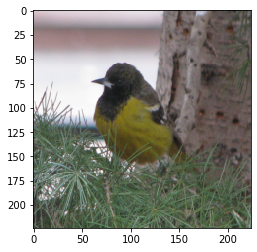

In [0]:
for i,(x,y) in enumerate(train_loader):
  if i==1: break
  for j in range(5):
    plt.imshow(x[j].permute(1,2,0))
    plt.savefig(f'bird_{j+1}.png')
    #plt.show() 

**Logistic Regression Classification**

**Q1b (2 pts):** Use PyTorch to create a Logistic Regression model to classify the Bird Datset. Plot the training curve and report the training / val accuracy in the writeup. Discuss how you tuned your hyperparameters in the writeup.

In [0]:
%load_ext tensorboard
logger1 = SummaryWriter('logs/LR')

In [0]:
# TODO: INSERT CODE HERE
class LogisticRegression(nn.Module):
  def __init__(self):
    super(LogisticRegression,self).__init__()
    self.l1 = nn.Linear(3*224*224, 195)

  def forward(self, x):
    x = x.view(-1, 3*224*224)
    x = self.l1(x)
    return x

LR = LogisticRegression()

In [0]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(LR.parameters(), lr=0.001)

epochs = 10
for epoch in range(epochs):
  correct = 0
  total = 0
  for i,(x,y) in enumerate(train_loader):
    x, y = x.to(device), y.to(device)
    LR = LR.to(device)
    optimizer.zero_grad()

    output = LR(x)
    loss = criterion(output, y)
    loss.backward()
    optimizer.step()

    _,predict = torch.max(output,1)
    correct += (predict==y).sum().item()
    total += y.size(0)

  logger1.add_scalar('training accuracy', correct/total, epoch)
  print(f'Epoch:{epoch+1} Training accuracy:{100*correct/total}%')

Epoch:1 Training accuracy:0.5352960856473737%
Epoch:2 Training accuracy:1.1040481766477082%
Epoch:3 Training accuracy:2.275008364001338%
Epoch:4 Training accuracy:7.594513215122115%
Epoch:5 Training accuracy:12.847106055536969%
Epoch:6 Training accuracy:19.06992305118769%
Epoch:7 Training accuracy:22.047507527601205%
Epoch:8 Training accuracy:22.883907661425226%
Epoch:9 Training accuracy:27.567748410839744%
Epoch:10 Training accuracy:31.850117096018735%


In [0]:
with torch.no_grad():
  correct = 0
  total = 0
  for i,(x,y) in enumerate(val_loader):
    x, y = x.to(device), y.to(device)

    output = LR(x)
    _,predict = torch.max(output,1)

    correct += (predict==y).sum().item()
    total += y.size(0)
    
  print(f'Validation accuracy:{100*correct/total}%')

Validation accuracy:2.4699599465954605%


In [0]:
%tensorboard --logdir 'logs/LR'

**Feed Forward Neural Network Classification**

**Q1c (3 pts):** Create a Feed Forward neural network to classify the Bird Dataset. Plot the training curve and report the training / val accuracy in the writeup. Discuss how you tuned your hyperparameters in the writeup.

In [0]:
# TODO: INSERT CODE HERE
class FeedForward(nn.Module):
  def __init__(self):
    super(FeedForward,self).__init__()
    self.l1 = nn.Linear(3*224*224, 512)
    self.l2 = nn.Linear(512, 195)

  def forward(self, x):
    x = x.view(-1, 3*224*224)
    x = self.l1(x)
    x = self.l2(x)
    return x

FF = FeedForward()

In [0]:
logger2 = SummaryWriter('logs/FF')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(FF.parameters(), lr=0.001)

epochs = 10
for epoch in range(epochs):
  correct = 0
  total = 0
  for i,(x,y) in enumerate(train_loader):
    x, y = x.to(device), y.to(device)
    FF = FF.to(device)
    optimizer.zero_grad()

    output = FF(x)
    loss = criterion(output, y)
    loss.backward()
    optimizer.step()

    _,predict = torch.max(output,1)
    correct += (predict==y).sum().item()
    total += y.size(0)

  logger2.add_scalar('training accuracy', correct/total, epoch)
  print(f'Epoch:{epoch+1} Training accuracy:{100*correct/total}%')

Epoch:1 Training accuracy:0.5352960856473737%
Epoch:2 Training accuracy:0.9702241552358648%
Epoch:3 Training accuracy:1.0705921712947475%
Epoch:4 Training accuracy:1.9404483104717296%
Epoch:5 Training accuracy:2.776848444295751%
Epoch:6 Training accuracy:4.382736701237873%
Epoch:7 Training accuracy:6.022080963532954%
Epoch:8 Training accuracy:5.252592840414854%
Epoch:9 Training accuracy:7.995985279357645%
Epoch:10 Training accuracy:12.880562060889929%


In [0]:
with torch.no_grad():
  correct = 0
  total = 0
  for i,(x,y) in enumerate(val_loader):
    x, y = x.to(device), y.to(device)

    output = FF(x)
    _,predict = torch.max(output,1)

    correct += (predict==y).sum().item()
    total += y.size(0)
    
  print(f'Validation accuracy:{100*correct/total}%')

Validation accuracy:1.0013351134846462%


In [0]:
%tensorboard --logdir 'logs/FF'

Reusing TensorBoard on port 6007 (pid 505), started 2:43:35 ago. (Use '!kill 505' to kill it.)

**CNN Classification**

**Q1d (6 pts):** Create a CNN to classify the Bird Dataset. Plot the training curve and report the training / val accuracy in the writeup. Discuss how you tuned your hyperparameters in the writeup.

In [0]:
# TODO: INSERT CODE HERE
class ConvNet(nn.Module):
  def __init__(self):
    super(ConvNet,self).__init__()
    self.conv1 = nn.Sequential(
       nn.Conv2d(3, 12, 3, 2),
       #nn.BatchNorm2d(12),
       nn.ReLU()
    )
    self.conv2 = nn.Sequential(
       nn.Conv2d(12, 24, 3, 2),
       #nn.BatchNorm2d(24),
       nn.ReLU(),
       nn.Dropout(0.2)
    )
    self.conv3 = nn.Sequential(
       nn.Conv2d(24, 12, 3, 2),
       #nn.BatchNorm2d(12), 
       nn.ReLU(),
       nn.Dropout(0.1)
    )

    self.l1 = nn.Linear(12*27*27, 6*14*14)
    self.l2 = nn.Linear(6*14*14, 195)

  def forward(self, x):
    x = self.conv1(x)
    x = self.conv2(x)
    x = self.conv3(x)
    x = x.view(x.size(0),-1)
    x = self.l1(x)
    x = self.l2(x)
    return x
CNN = ConvNet()

In [0]:
logger3 = SummaryWriter('logs/CNN')
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(CNN.parameters(), lr=0.001)

epochs = 10
for epoch in range(epochs):
  correct = 0
  total = 0
  for i,(x,y) in enumerate(train_loader):
    x, y = x.to(device), y.to(device)
    CNN = CNN.to(device)
    optimizer.zero_grad()
    
    output = CNN(x)
    loss = criterion(output, y)
    loss.backward()
    optimizer.step()

    _,predict = torch.max(output,1)
    correct += (predict==y).sum().item()
    total += y.size(0)

  logger3.add_scalar('training accuracy', correct/total, epoch)
  print(f'Epoch:{epoch+1} Training accuracy:{100*correct/total}%')

Epoch:1 Training accuracy:0.4349280695884911%
Epoch:2 Training accuracy:0.5018400802944128%
Epoch:3 Training accuracy:0.702576112412178%
Epoch:4 Training accuracy:0.5018400802944128%
Epoch:5 Training accuracy:0.5352960856473737%
Epoch:6 Training accuracy:0.7694881231180997%
Epoch:7 Training accuracy:0.7360321177651389%
Epoch:8 Training accuracy:1.0705921712947475%
Epoch:9 Training accuracy:2.8772164603546337%
Epoch:10 Training accuracy:6.323185011709602%


In [0]:
with torch.no_grad():
  correct = 0
  total = 0
  for i,(x,y) in enumerate(val_loader):
    x, y = x.to(device), y.to(device)

    output = CNN(x)
    _,predict = torch.max(output,1)

    correct += (predict==y).sum().item()
    total += y.size(0)
    
  print(f'Validation accuracy:{100*correct/total}%')

Validation accuracy:1.335113484646195%


In [0]:
%tensorboard --logdir 'logs/CNN'        

**Comparing Results**

**Q1e(2 pts):** Which model performed the best? Compare the results of your different models in your writeup.

**Submitting your solutions**
Like the previous homework assignments, complete the following headers that return a Numpy array with predictions (i.e. a 0-195 label for which class each sample belongs to). Read the **Inputs:** and **Outputs:** sections carefully.

In [0]:
# Inputs: The input to this function is the absolute path to the root folder of a directory of image
# from the caltech birds dataset.

# Output: Return a **numpy** array with a label from 0-195 for each of the individual images.
# Please remember to not shuffle your images so you can generate the correct predictions. The
# class label (0-195) comes from the folder name in your training dataset. For instance, any image
# from the folder named "007.Parakeet_Auklet" has a ground truth class label of "7". Your output
# should look something like: [0, 73, 165, 190, 12, ... , 93]

# Note that you have to implement three of these, one for each of the three different classifiers.

def generate_pytorch_caltech_birds_outputs(input):
  # TODO: Write your code here
  test_list = glob(input+'/*.jpg')
  test_list.sort()
  res = []
  for path in test_list:  
    img = Image.open(path)
    img = transform(img).to(device)
    output = LR(img)
    _,predict = torch.max(output,1)
    res.append(int(predict)+1)            
  return np.array(res)

def generate_feedforward_caltech_birds_outputs(input):
  # TODO: Write your code here
  test_list = glob(input+'/*.jpg')
  test_list.sort()
  res = []
  for path in test_list:  
    img = Image.open(path)
    img = transform(img).to(device)
    output = FF(img)
    _,predict = torch.max(output,1)
    res.append(int(predict)+1)            
  return np.array(res)

def generate_CNN_caltech_birds_outputs(input):
  # TODO: Write your code here
  test_list = glob(input+'/*.jpg')
  test_list.sort()
  res = []
  for path in test_list:  
    img = Image.open(path)
    img = transform(img).unsqueeze(0).to(device)
    output = CNN(img)
    _,predict = torch.max(output,1)
    res.append(int(predict)+1)            
  return np.array(res)

In [0]:
test_case_1b = generate_caltech_ucsd_birds_predictions(generate_pytorch_caltech_birds_outputs)
test_case_1c = generate_caltech_ucsd_birds_predictions(generate_feedforward_caltech_birds_outputs)
test_case_1d = generate_caltech_ucsd_birds_predictions(generate_CNN_caltech_birds_outputs)

## Question 2. Transfer Learning on ResNets for Image Classification (15 pts)

In this question we will explore different ways to bootstrap your image classifier when training examples are scarce. For the bird dataset, we have around 15 training images for each class, and variation between each class is limited (all birds). Due to the limited number of training examples, building a high-performing image classifier is challenging. 

ImageNet is one of the most popular computer vision data sets. It  contains 10 million images in total from multiple different categories. PyTorch provides ResNets that are pre-trained on ImageNet, and using this pretrained model, we can build a bird classifier much more easily. 

**Q2 (15 pts):** In the code snippet below, load a pre-trained ResNet model and swap out the last fully connected layer from the network with your own classification layer. Train the network, plot your training accuracy, and report your final validation accuracy. 
 A few tips:

* After the last fully connected layer of the network, remember to freeze the network except for the last layer to speed up the training.

* Pretrained ResNet models assumes that input is normalized in the following fashion, and is of the size at least 224.

In [0]:
input_size = 224
input_transforms = transforms.Compose([
            transforms.Resize((input_size, input_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])

In [0]:
train_dataset = dset.ImageFolder(root='DATASETS/Caltech/train', transform=input_transforms) 
val_dataset = dset.ImageFolder(root='DATASETS/Caltech/val', transform=input_transforms)

batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True)

In [0]:
ResNet_model = tv.models.resnet50(pretrained=True)
for param in ResNet_model.parameters():
  param.requires_grad = False
ResNet_model.fc = nn.Linear(2048, 195)

logger4 = SummaryWriter('logs/TL')
optimizer = torch.optim.Adam(ResNet_model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/checkpoints/resnet50-19c8e357.pth


In [0]:
epochs = 10
for epoch in range(epochs):
  correct = 0
  total = 0
  for (x,y) in train_loader:
    x, y = x.to(device), y.to(device)
    ResNet_model = ResNet_model.to(device)
    optimizer.zero_grad()

    output = ResNet_model(x)
    loss = criterion(output, y)
    loss.backward()
    optimizer.step()

    _,predict = torch.max(output, 1)
    correct += (predict==y).sum().item()
    total += y.size(0)

  logger4.add_scalar('training accuracy', correct/total, epoch)
  print(f'Epoch:{epoch+1} Training accuracy:{100*correct/total}%')  

Epoch:1 Training accuracy:6.657745065239211%
Epoch:2 Training accuracy:38.842422214787554%
Epoch:3 Training accuracy:60.62228169956507%
Epoch:4 Training accuracy:72.16460354633656%
Epoch:5 Training accuracy:79.89294078287053%
Epoch:6 Training accuracy:85.9819337571094%
Epoch:7 Training accuracy:90.13047842087654%
Epoch:8 Training accuracy:92.67313482770157%
Epoch:9 Training accuracy:94.98159919705587%
Epoch:10 Training accuracy:96.21947139511542%


In [0]:
with torch.no_grad():
  correct = 0
  total = 0
  for i,(x,y) in enumerate(val_loader):
    x, y = x.to(device), y.to(device)

    output = ResNet_model(x)
    _,predict = torch.max(output,1)

    correct += (predict==y).sum().item()
    total += y.size(0)
    
  print(f'Validation accuracy:{100*correct/total}%')

Validation accuracy:46.19492656875835%


In [0]:
%tensorboard  --logdir 'logs/TL'

In [0]:
# Inputs: The input to this function is the absolute path to the root folder of a directory of image
# from the caltech birds dataset.

# Output: Return a **numpy** array with a label from 0-195 for each of the individual images.
# Please remember to not shuffle your images so you can generate the correct predictions. The
# class label (0-195) comes from the folder name in your training dataset. For instance, any image
# from the folder named "007.Parakeet_Auklet" has a ground truth class label of "7". Your output
# should look something like: [0, 73, 165, 190, 12, ... , 93]

def generate_CNN_transfer_learning_caltech_birds_outputs(input):
  # TODO: Write your code here
  test_path = glob(input+'/*.jpg')
  test_path.sort()
  res = []
  for path in test_path:
    img = Image.open(path)
    img = input_transforms(img).unsqueeze(0).to(device)
    output = ResNet_model(img)
    _,predict = torch.max(output.data, 1)
    res.append(int(predict)+1)
  return np.array(res)

In [0]:
test_case_2a = generate_caltech_ucsd_birds_predictions(generate_CNN_transfer_learning_caltech_birds_outputs)

## Question 3. Generative Models: Convolutional Autoencoders and Variational Autoencoders (30 pts)

**Note: From here onwards you will be using the UT Zappos50k dataset**

In this question you will create a Convolutional AutoEncoder (CAE) and a Variational AutoEncoder (VAE) for the UT Zappos50K Dataset. Before you *slide* into this part, please read the slides thoroughly to ensure that you understand how an autoencoder works (i.e. the loss function and general structure). 

To get good reconstruction results, the AE might take a long time to train (for instance > 2 hours); however, you should be able to tell whether or not your network is learning much earlier than that. Be sure to not just look at your loss, but also periodically examine your image outputs to ensure that they are becoming sharper and sharper representations of your input image. The choice of when to stop your AE's training is up to your discretion (however the output should be reasonably close). 





**Q3a (2 pts):** Create a PyTorch Dataset / DataLoader using the UTZappos50K dataset and visualize 5 images. Similarly, create a train/val/test split along with corresponding datasets / dataloaders. Visualize 5 images from each of these sets in your writeup. Note in your writeup what split you decided to use and your rationale why.

In [0]:
# TODO: INSERT CODE HERE
UT_transforms = transforms.Compose([ transforms.Resize((100, 100)),
                    transforms.ToTensor()
                    ])
UT_dataset = dset.ImageFolder(root='DATASETS/UTZappos50K', transform=UT_transforms)

In [0]:
idx = list(range(len(UT_dataset)))
np.random.shuffle(idx)

split1, split2 = int(np.floor(len(idx)*0.7)), int(np.floor(len(idx)*0.9))
ut_train_sampler = SubsetRandomSampler(idx[:split1])
ut_val_sampler = SubsetRandomSampler(idx[split1:split2])
ut_test_sampler = SubsetRandomSampler(idx[split2:])

batch_size = 64
ut_train_loader = DataLoader(UT_dataset, batch_size=batch_size, sampler=ut_train_sampler)
ut_val_loader = DataLoader(UT_dataset, batch_size=batch_size, sampler=ut_val_sampler)
ut_test_loader = DataLoader(UT_dataset, batch_size=batch_size, sampler=ut_test_sampler)

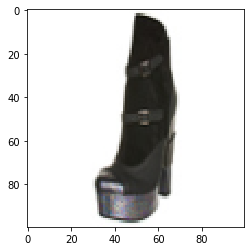

In [0]:
for i, (x,y) in enumerate(ut_test_loader):
  if i == 1: break
  for j in range(5):
    plt.imshow(x[j].permute(1,2,0))
    plt.savefig(f'ut_{j+1}.png')
    #plt.show() 

**Q3b (10 pts):** Create a Convolutional AutoEncoder (CAE) to reconstruct your input images. After creating your CAE, plot the resulting training loss curve (average training loss per epoch) and in your report give 5 examples of the input and corresponding reconstruction. Also plot a validation loss curve (average validation loss per epoch).

In [0]:
# TODO: INSERT CODE HERE
class CAE(nn.Module):
  def __init__(self):
    super(CAE, self).__init__()
    self.encoder = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=16, kernel_size=2, stride=2, padding=0),
        nn.ReLU(),             
        #nn.MaxPool2d(2, stride=2),            
        nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3, stride=3, padding=0),     
        nn.ReLU(),          
        #nn.MaxPool2d(2, stride=2),           
        nn.Tanh()    )
    self.decoder = nn.Sequential(
        nn.ConvTranspose2d(in_channels=8, out_channels=12, kernel_size=5, stride=2, padding=1),       
        nn.ReLU(),             
        nn.ConvTranspose2d(in_channels=12, out_channels=3, kernel_size=4, stride=3, padding=0),
        nn.Sigmoid()   )       

  def forward(self, x):
    z = self.encoder(x)
    recon_x = self.decoder(z)
    return recon_x   

In [0]:
model_cae = CAE().to(device)
optimizer = torch.optim.Adam(model_cae.parameters(), lr=0.001)
criterion = nn.MSELoss()

summary(model_cae, (3,100,100))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 50, 50]             208
              ReLU-2           [-1, 16, 50, 50]               0
            Conv2d-3            [-1, 8, 16, 16]           1,160
              ReLU-4            [-1, 8, 16, 16]               0
              Tanh-5            [-1, 8, 16, 16]               0
   ConvTranspose2d-6           [-1, 12, 33, 33]           2,412
              ReLU-7           [-1, 12, 33, 33]               0
   ConvTranspose2d-8          [-1, 3, 100, 100]             579
           Sigmoid-9          [-1, 3, 100, 100]               0
Total params: 4,359
Trainable params: 4,359
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.11
Forward/backward pass size (MB): 1.31
Params size (MB): 0.02
Estimated Total Size (MB): 1.45
-----------------------------------------------

In [0]:
epochs = 20
logger5 = SummaryWriter('logs/CAE')
for epoch in range(epochs):
  Loss = 0
  for i, (x,_) in enumerate(ut_train_loader):
    x = x.to(device)
    optimizer.zero_grad()

    recon_x = model_cae(x)
    loss = criterion(recon_x, x)
    loss.backward()
    optimizer.step()

    Loss += loss.item()

  logger5.add_scalar('training loss', Loss, epoch)
  print(f'Epoch: {epoch+1} Training Loss: {Loss}')

Epoch: 1 Training Loss: 1.9599963545333594
Epoch: 2 Training Loss: 1.9219258676748723
Epoch: 3 Training Loss: 1.886966037331149
Epoch: 4 Training Loss: 1.8544770174194127
Epoch: 5 Training Loss: 1.8168264168780297
Epoch: 6 Training Loss: 1.7755745819304138
Epoch: 7 Training Loss: 1.7352793177124113
Epoch: 8 Training Loss: 1.701393457595259
Epoch: 9 Training Loss: 1.6758037183899432
Epoch: 10 Training Loss: 1.6539546241983771
Epoch: 11 Training Loss: 1.63788509555161
Epoch: 12 Training Loss: 1.620775962015614
Epoch: 13 Training Loss: 1.6056929144542664
Epoch: 14 Training Loss: 1.5939449772704393
Epoch: 15 Training Loss: 1.5811339730862528
Epoch: 16 Training Loss: 1.5672734379768372
Epoch: 17 Training Loss: 1.5605179173871875
Epoch: 18 Training Loss: 1.546796525362879
Epoch: 19 Training Loss: 1.5375781098846346
Epoch: 20 Training Loss: 1.5316529721021652


In [0]:
%tensorboard  --logdir 'logs/CAE'

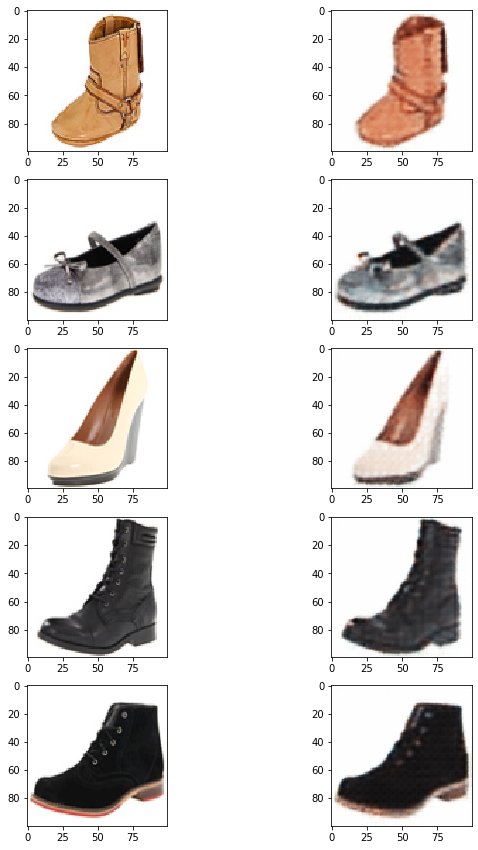

In [0]:
indices = np.random.choice(len(UT_dataset), 5, replace=False)
original_imgs = torch.empty([5,3,100,100], dtype=torch.float32)
reconstruct_imgs = torch.empty([5,3,100,100], dtype=torch.float32)
count = 0
for i in indices:
  original_imgs[count] = UT_dataset[i][0] 

  x = UT_dataset[i][0].unsqueeze(0).to(device)
  z = model_cae.encoder(x)
  recon_x = model_cae.decoder(z)
  
  reconstruct_imgs[count] = recon_x.data.cpu()
  count += 1

plt.figure(figsize=(10,15))
for j in range(5):
  plt.subplot(5,2,2*j+1)
  plt.imshow(original_imgs[j].permute(1,2,0))
  plt.subplot(5,2,2*j+2)
  plt.imshow(reconstruct_imgs[j].permute(1,2,0))
plt.savefig('cae.png')

**Q3c (15 pts):** Variational AutoEncoders, as covered in class, learn the probability distribution of the inputs and can be used to generate novel images.  We can further pass convolutional features into a VAE to create a convolutional VAE.  Convert your CAE from the previous question to a convolutional VAE by executing the following steps:

* In the encoder, generate two tensors of the same length, representing mean and standard deviation of the latent probability distribution. 

* Sample from a normal distribution from the learned mean and std to generate the final encoding tensor -- this is the reparametrization trick discussed in lecture.

* Decode from the encoding tensor just as in the convolutional autoencoder. 

* Change your loss function from MSE reconstruction loss to the objective function for VAE:
 * Reconstrucation Loss: binary_cross_entropy loss between original and reconstructed image. 
 * Regularization on the sampled latent normal distribution 

$$ L_{reconstruciton} = -\frac{1}{n} \sum_{i}^{n}(x_i log(f(z_i)) + (1-x_i) log(1-f(z_i))) $$
$$ L_{regularization} = \frac{1}{2n}\sum_{i}^{n}(\mu_{i}^{2} + \sigma_{i}^2 - log(\sigma_i^2)- 1)$$
$$ L_{loss} =L_{regularization} +  L_{reconstruction}$$

In your report, plot the resulting training loss curve (average training loss per epoch) and your validation loss curve (average validation loss per epoch). In your report give 5 examples of the input and corresponding reconstruction.





In [0]:
# TODO: INSERT CODE HERE
class VAE(nn.Module):
  def __init__(self):
    super(VAE, self).__init__()

    self.encoder = nn.Sequential(
        nn.Conv2d(in_channels=3, out_channels=12, kernel_size=2, stride=2, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(12),
        nn.Conv2d(in_channels=12, out_channels=24, kernel_size=4, stride=2, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(24),
        nn.Conv2d(in_channels=24, out_channels=6, kernel_size=3, stride=3, padding=0),
        nn.Tanh()        
        )
    
    self.l1 = nn.Linear(6*8*8, 256)
    self.l2 = nn.Linear(6*8*8, 256)
    self.l3 = nn.Linear(256, 6*8*8)

    self.decoder = nn.Sequential(
        nn.ConvTranspose2d(in_channels=6, out_channels=12, kernel_size=2, stride=2, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(12),
        nn.ConvTranspose2d(in_channels=12, out_channels=24, kernel_size=3, stride=2, padding=0),
        nn.ReLU(),
        nn.BatchNorm2d(24),
        nn.ConvTranspose2d(in_channels=24, out_channels=3, kernel_size=4, stride=3, padding=0),
        nn.Sigmoid()        
        )
  
  def reparametrize(self, mu, log_var):
    std = torch.exp(log_var/2)
    eps = torch.randn_like(std)
    return eps.mul(std).add_(mu)

  def forward(self, x):
    x = self.encoder(x)   
    x = x.view(x.size(0), -1)
    mu, log_var = self.l1(x), self.l2(x)
    z = self.reparametrize(mu, log_var)
    z = self.l3(z)
    recon_x = self.decoder(z.view(-1,6,8,8))
    return recon_x, mu, log_var


In [0]:
model_vae = VAE().to(device)
optimizer = torch.optim.Adam(model_vae.parameters(), lr=0.001)
summary(model_vae, (3,100,100))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 12, 50, 50]             156
              ReLU-2           [-1, 12, 50, 50]               0
       BatchNorm2d-3           [-1, 12, 50, 50]              24
            Conv2d-4           [-1, 24, 24, 24]           4,632
              ReLU-5           [-1, 24, 24, 24]               0
       BatchNorm2d-6           [-1, 24, 24, 24]              48
            Conv2d-7              [-1, 6, 8, 8]           1,302
              Tanh-8              [-1, 6, 8, 8]               0
            Linear-9                  [-1, 256]          98,560
           Linear-10                  [-1, 256]          98,560
           Linear-11                  [-1, 384]          98,688
  ConvTranspose2d-12           [-1, 12, 16, 16]             300
             ReLU-13           [-1, 12, 16, 16]               0
      BatchNorm2d-14           [-1, 12,

In [0]:
def loss_func(recon_x, x, mu, log_var):
  # reconstruction loss
  RCL = F.binary_cross_entropy(recon_x, x, reduction='sum')

  # KL divergence loss
  KLD = 0.5 * torch.sum(mu**2 + log_var.exp() - 1 - log_var)
  return RCL+0.1*KLD, RCL, KLD

In [0]:
def generate_images(imgs, rows, cols, name=None, show=True):
  '''
  Displays the images in a rows * cols grid
  '''
  imgs = imgs[:rows*cols].cpu().detach()
  fig, ax = plt.subplots(rows, cols)
  count = 0
  imgs = np.reshape(imgs, (imgs.shape[0],3,100,100))
  imgs = np.clip(imgs, a_min=0, a_max=255) 

  for row in range(rows):
    for col in range(cols):
      img = imgs[count]
      ax[row,col].imshow(img.permute(1,2,0))
      ax[row,col].axis('off')
      count += 1

  fig.suptitle(name)
  fig.savefig("%s.png"%(name))

  if(show): plt.show()
  else: plt.close()

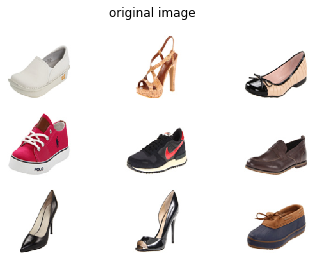

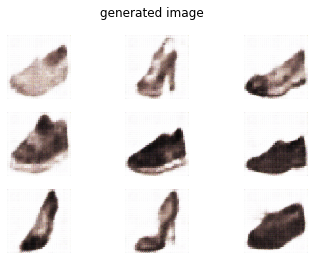

Epoch: 1 Loss: 9923.7786 RCL: 9866.1638 KLD: 576.1482


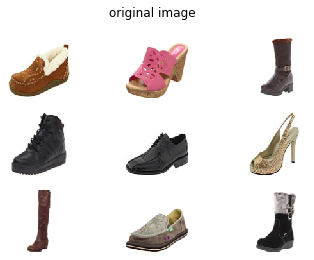

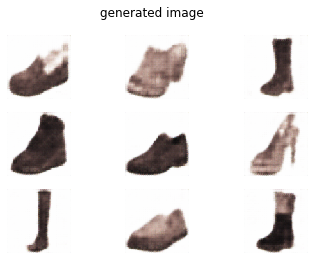

Epoch: 2 Loss: 7267.2643 RCL: 7200.5568 KLD: 667.0757


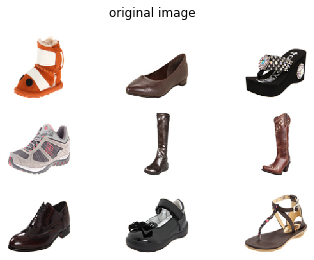

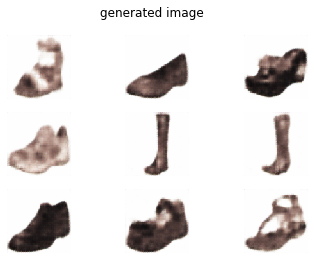

Epoch: 3 Loss: 7139.9729 RCL: 7071.9710 KLD: 680.0189


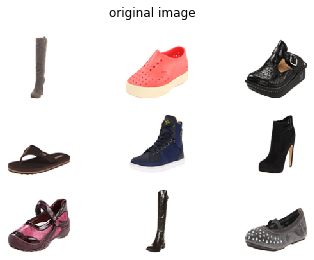

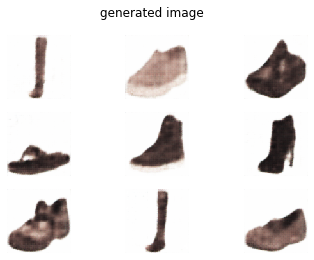

Epoch: 4 Loss: 7093.1370 RCL: 7025.3703 KLD: 677.6673


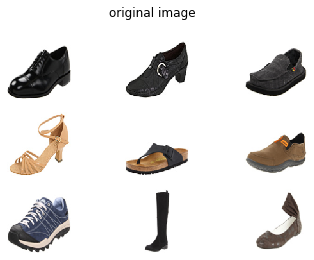

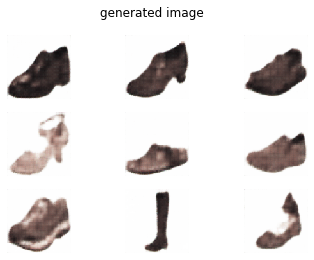

Epoch: 5 Loss: 7111.6424 RCL: 7040.6704 KLD: 709.7204


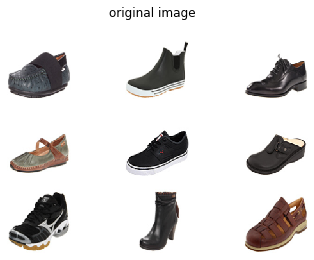

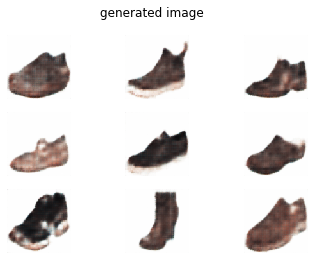

Epoch: 6 Loss: 7033.2757 RCL: 6966.5852 KLD: 666.9046


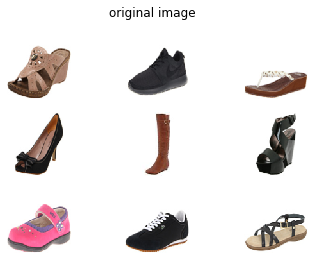

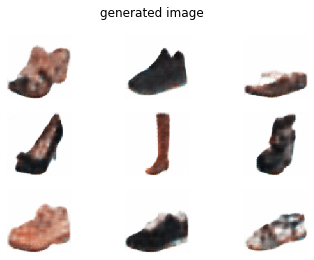

Epoch: 7 Loss: 7031.8231 RCL: 6963.0739 KLD: 687.4915


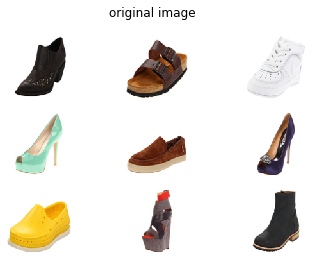

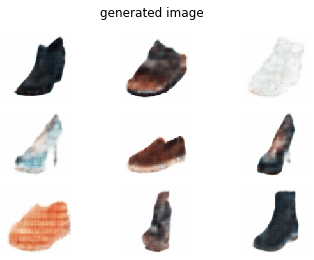

Epoch: 8 Loss: 6934.7237 RCL: 6867.4323 KLD: 672.9140


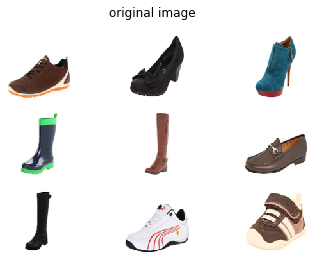

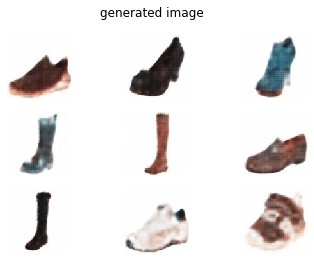

Epoch: 9 Loss: 6912.8310 RCL: 6845.2267 KLD: 676.0431


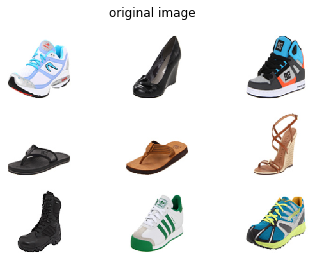

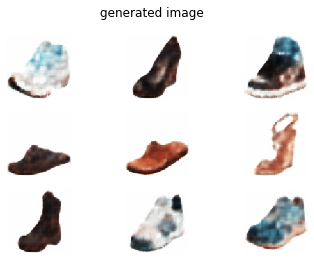

Epoch: 10 Loss: 6895.2158 RCL: 6827.4773 KLD: 677.3853


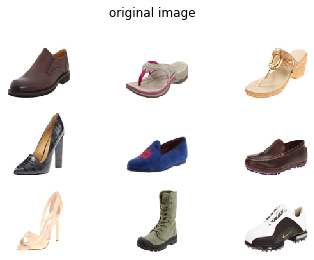

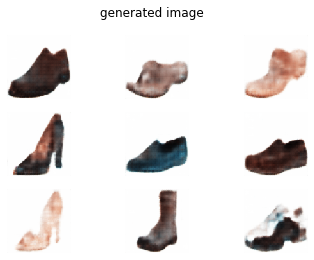

Epoch: 11 Loss: 6889.6624 RCL: 6821.9642 KLD: 676.9825


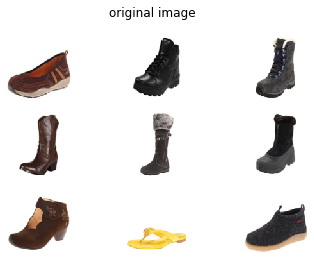

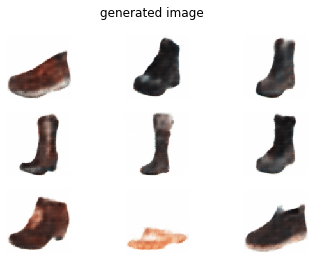

Epoch: 12 Loss: 6876.2413 RCL: 6808.6584 KLD: 675.8284


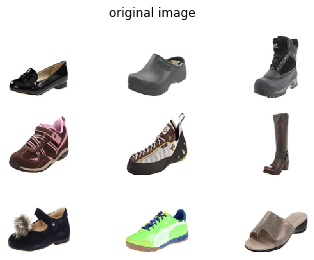

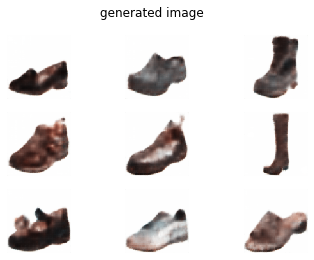

Epoch: 13 Loss: 6878.6936 RCL: 6811.7541 KLD: 669.3948


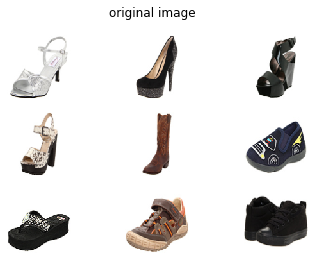

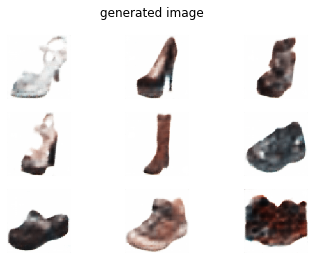

Epoch: 14 Loss: 6864.6022 RCL: 6797.6131 KLD: 669.8910


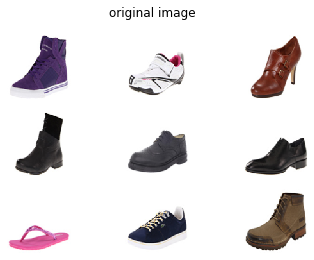

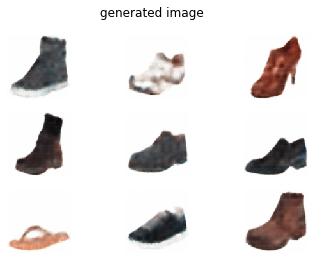

Epoch: 15 Loss: 6856.1516 RCL: 6789.0774 KLD: 670.7424


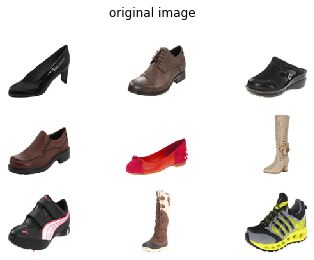

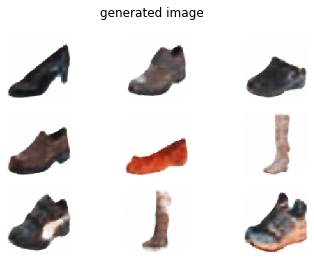

Epoch: 16 Loss: 6853.1618 RCL: 6786.4539 KLD: 667.0789


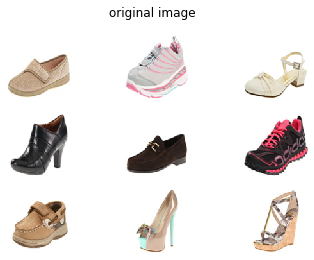

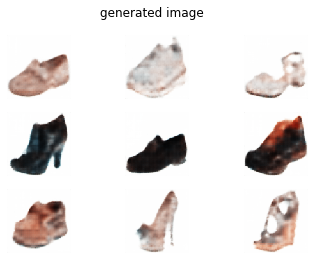

Epoch: 17 Loss: 6842.3128 RCL: 6775.4358 KLD: 668.7697


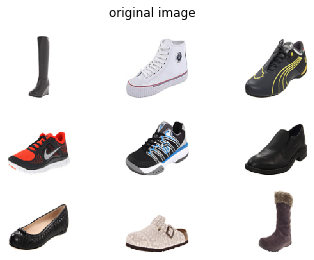

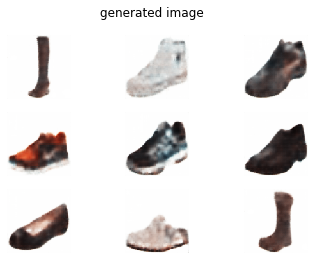

Epoch: 18 Loss: 6837.2645 RCL: 6770.5756 KLD: 666.8897


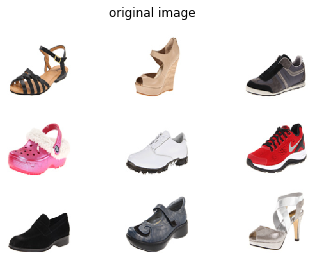

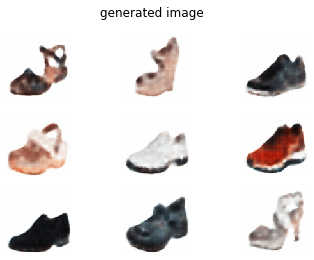

Epoch: 19 Loss: 6833.0378 RCL: 6766.3782 KLD: 666.5959


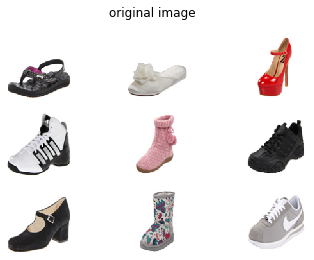

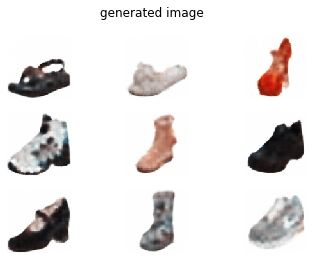

Epoch: 20 Loss: 6834.7312 RCL: 6768.3709 KLD: 663.6030


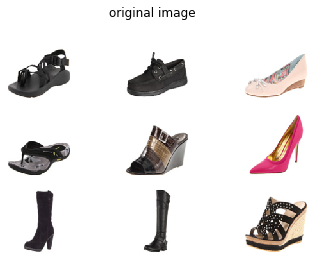

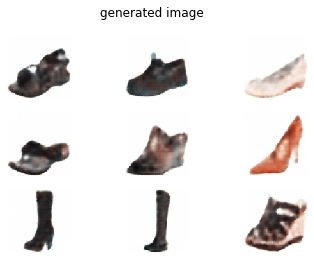

Epoch: 21 Loss: 6826.4158 RCL: 6760.3477 KLD: 660.6812


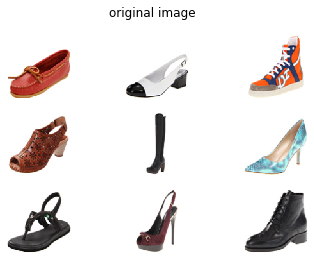

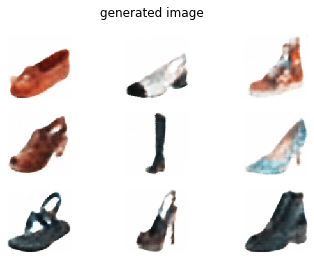

Epoch: 22 Loss: 6825.2936 RCL: 6759.4091 KLD: 658.8447


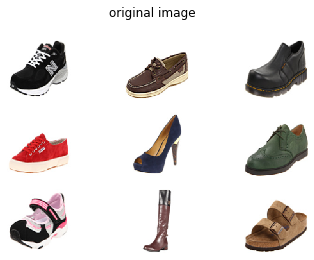

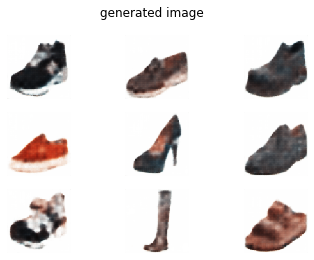

Epoch: 23 Loss: 6822.7248 RCL: 6757.1437 KLD: 655.8113


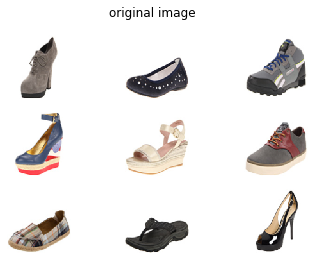

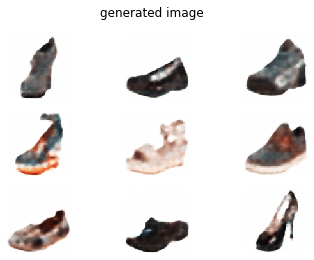

Epoch: 24 Loss: 6813.7352 RCL: 6748.0719 KLD: 656.6333


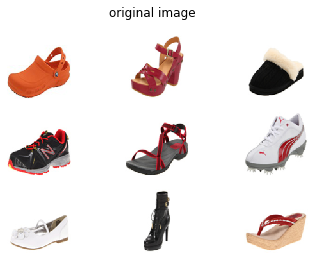

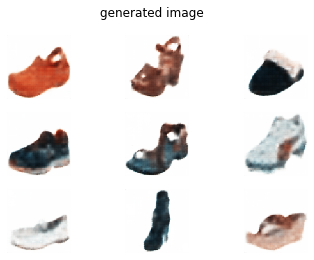

Epoch: 25 Loss: 6814.4739 RCL: 6748.9985 KLD: 654.7546


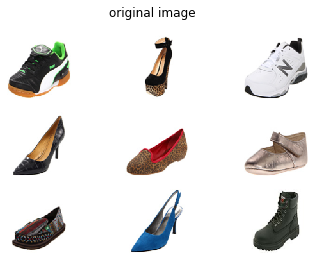

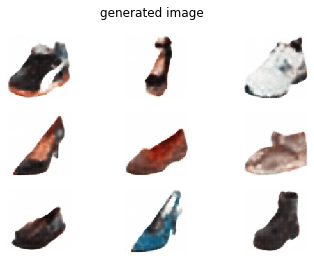

Epoch: 26 Loss: 6808.9288 RCL: 6743.5064 KLD: 654.2248


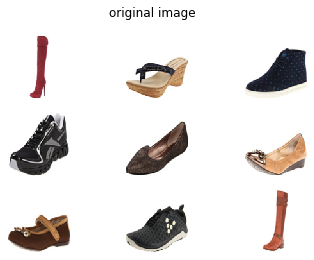

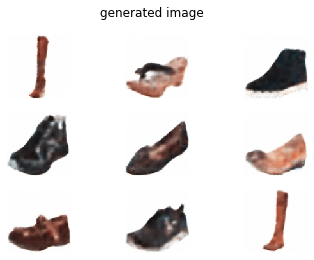

Epoch: 27 Loss: 6804.2683 RCL: 6738.8770 KLD: 653.9135


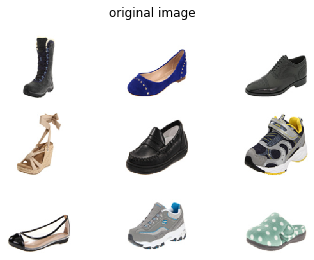

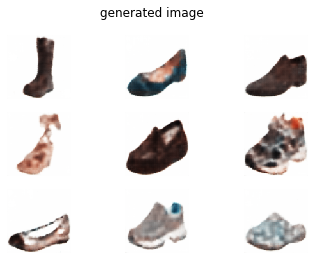

Epoch: 28 Loss: 6804.6666 RCL: 6739.5360 KLD: 651.3054


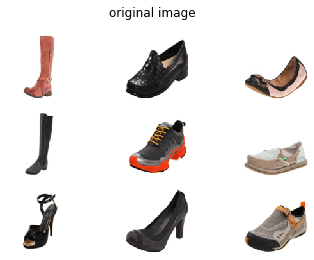

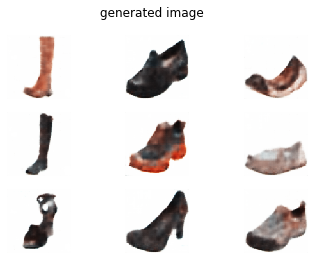

Epoch: 29 Loss: 6800.2372 RCL: 6735.2561 KLD: 649.8113


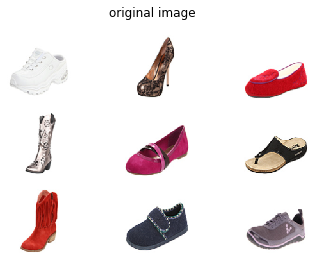

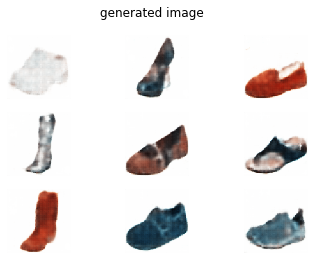

Epoch: 30 Loss: 6798.0054 RCL: 6733.0763 KLD: 649.2903


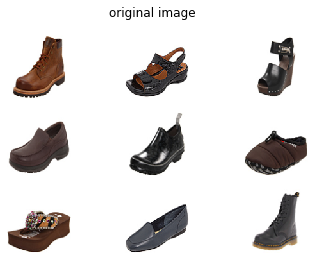

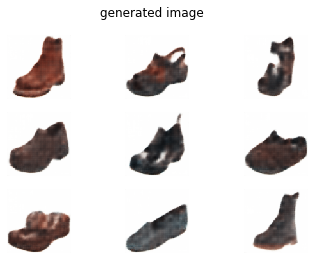

Epoch: 31 Loss: 6795.4509 RCL: 6730.5769 KLD: 648.7403


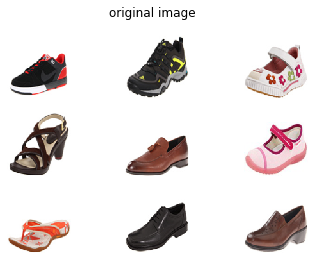

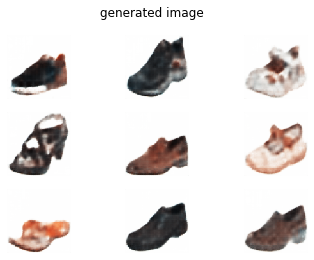

Epoch: 32 Loss: 6795.0124 RCL: 6730.3786 KLD: 646.3378


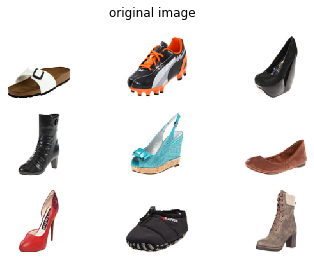

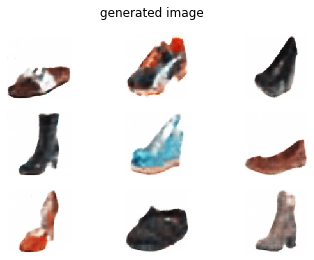

Epoch: 33 Loss: 6789.5470 RCL: 6724.9172 KLD: 646.2979


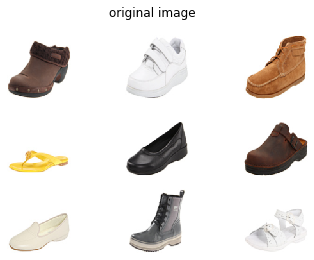

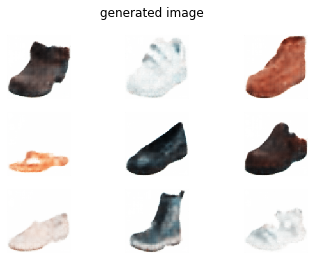

Epoch: 34 Loss: 6792.9950 RCL: 6728.6948 KLD: 643.0013


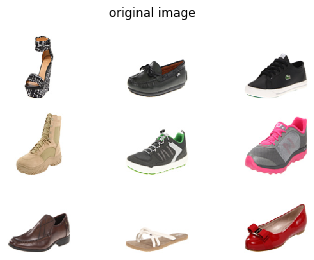

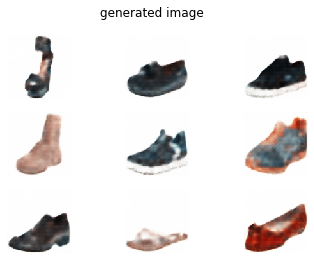

Epoch: 35 Loss: 6788.5266 RCL: 6724.2372 KLD: 642.8941


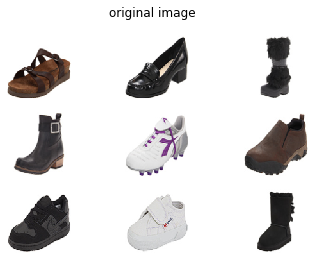

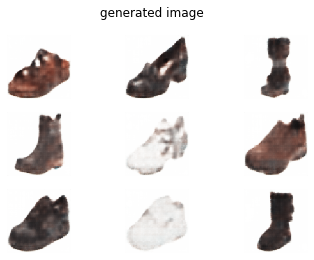

Epoch: 36 Loss: 6785.5365 RCL: 6721.4798 KLD: 640.5678


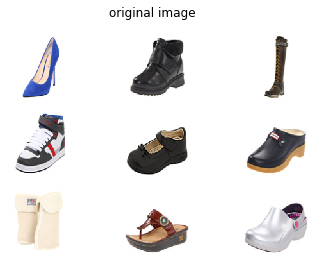

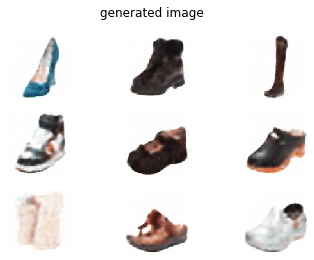

Epoch: 37 Loss: 6788.1330 RCL: 6724.1925 KLD: 639.4050


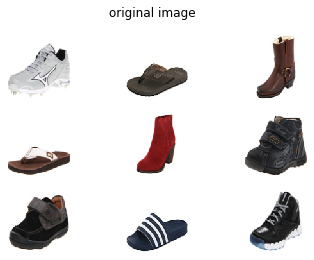

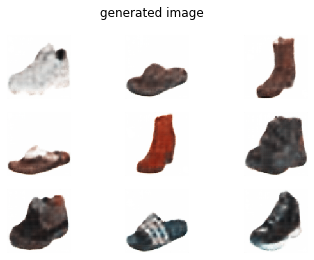

Epoch: 38 Loss: 6783.2605 RCL: 6719.4473 KLD: 638.1320


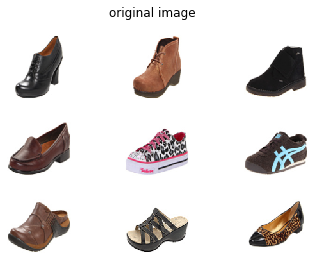

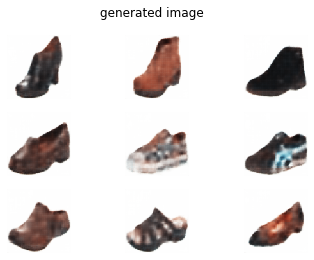

Epoch: 39 Loss: 6783.2276 RCL: 6719.5167 KLD: 637.1085


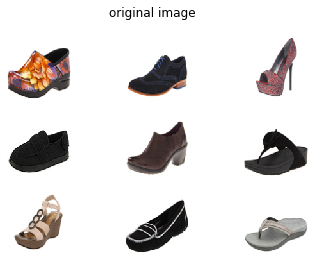

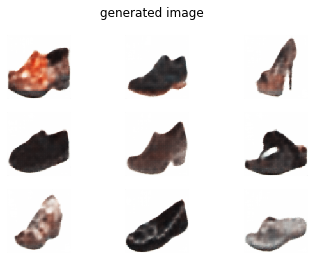

Epoch: 40 Loss: 6782.3396 RCL: 6718.7061 KLD: 636.3345


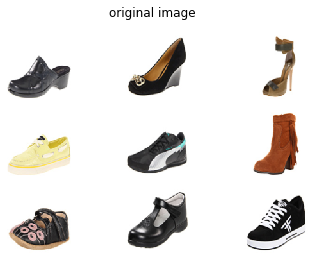

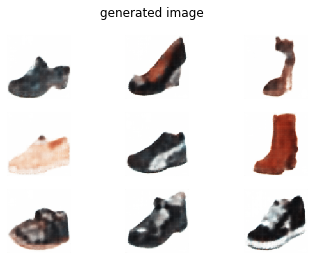

Epoch: 41 Loss: 6782.7101 RCL: 6719.2237 KLD: 634.8648


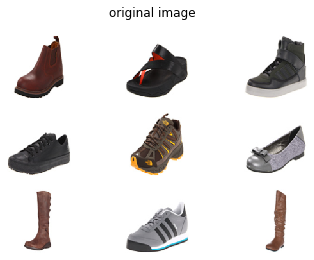

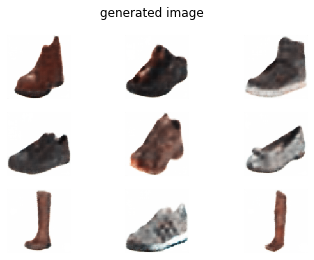

Epoch: 42 Loss: 6779.4094 RCL: 6716.0450 KLD: 633.6438


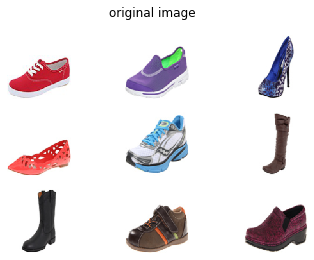

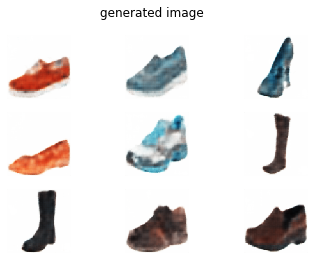

Epoch: 43 Loss: 6779.3106 RCL: 6716.1093 KLD: 632.0129


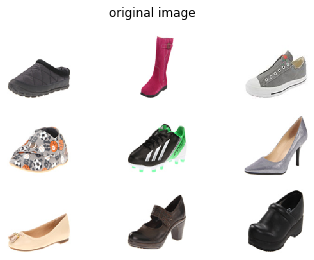

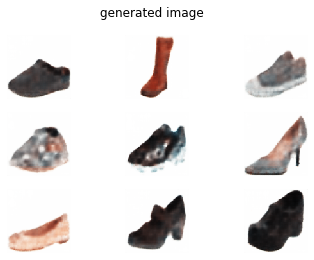

Epoch: 44 Loss: 6775.5430 RCL: 6712.2599 KLD: 632.8314


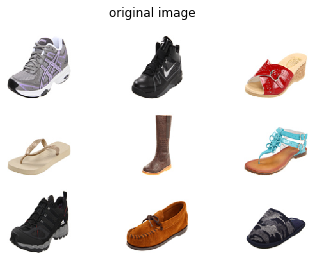

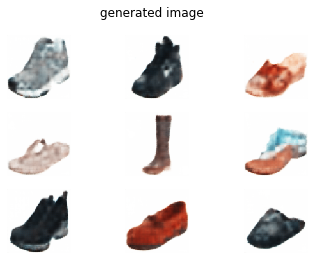

Epoch: 45 Loss: 6779.0229 RCL: 6716.0220 KLD: 630.0095


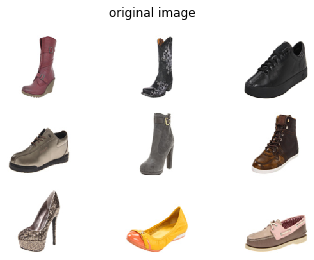

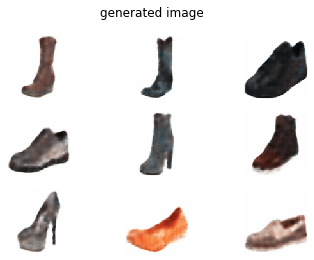

Epoch: 46 Loss: 6778.4517 RCL: 6715.5939 KLD: 628.5772


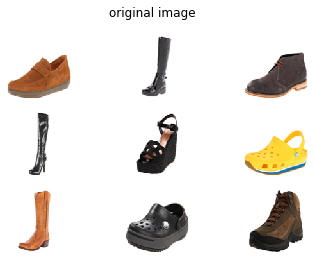

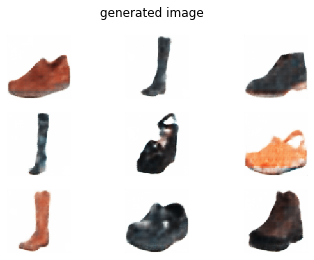

Epoch: 47 Loss: 6773.7591 RCL: 6710.9435 KLD: 628.1559


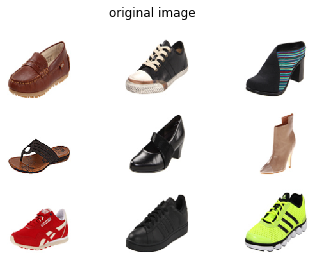

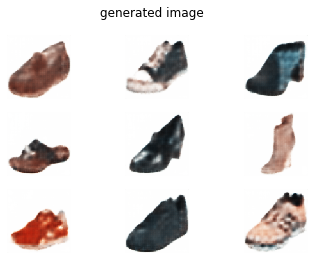

Epoch: 48 Loss: 6774.0502 RCL: 6711.3061 KLD: 627.4409


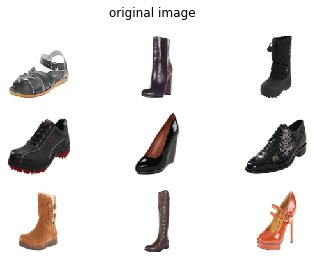

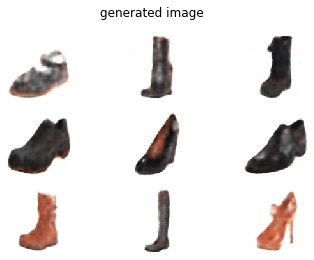

Epoch: 49 Loss: 6773.5126 RCL: 6710.8906 KLD: 626.2198


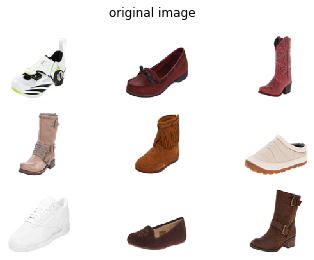

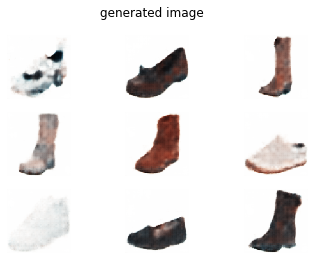

Epoch: 50 Loss: 6773.3783 RCL: 6710.9101 KLD: 624.6817


In [0]:
epochs = 25
logger6 = SummaryWriter('logs/VAE')
for epoch in range(epochs):
  RCL_Loss = 0
  KLD_Loss = 0
  Loss = 0
  total = 0
  for i, (x,_) in enumerate(ut_train_loader):
    x = x.to(device)
    optimizer.zero_grad()

    recon_x, mu, log_var = model_vae(x)
    loss, RCL, KLD = loss_func(recon_x, x, mu, log_var)
    loss.backward()
    optimizer.step()
    
    Loss += loss.item()
    RCL_Loss += RCL.item()
    KLD_Loss += KLD.item()   
    total += x.size(0)

  logger6.add_scalar('Total Loss', Loss/total, epoch)
  logger6.add_scalar('RCL Loss', RCL_Loss/total, epoch)
  logger6.add_scalar('KLD Loss', KLD_Loss/total, epoch)

  generate_images(x, 3, 3, name="original image", show=True)
  generate_images(recon_x, 3, 3, name="generated image", show=True)
  print('Epoch: {} Loss: {:.4f} RCL: {:.4f} KLD: {:.4f}'.format(epoch+1, Loss/total, RCL_Loss/total, KLD_Loss/total))

In [0]:
%tensorboard  --logdir 'logs/VAE'

In [0]:
indices = np.random.choice(len(UT_dataset), 5, replace=False)
original_imgs1 = torch.empty([5,3,100,100], dtype=torch.float32)
reconstruct_imgs1 = torch.empty([5,3,100,100], dtype=torch.float32)
count = 0
for i in indices:
  original_imgs1[count] = UT_dataset[i][0] 

  x = UT_dataset[i][0].unsqueeze(0).to(device)
  recon_x, mu, log_var = model_vae(x)
  
  reconstruct_imgs1[count] = recon_x.data.cpu()
  count += 1

plt.figure(figsize=(10,15))
for j in range(5):
  plt.subplot(5,2,2*j+1)
  plt.imshow(original_imgs1[j].permute(1,2,0))
  plt.subplot(5,2,2*j+2)
  plt.imshow(reconstruct_imgs1[j].permute(1,2,0))
plt.savefig('vae.png')

**Q3d (3 pts):** One of the many useful qualities of a VAE is that the resulting code vector has interpretable properties. To demonstrate this, choose two images from your dataset, call these images $X$ and $Y$. Compute their corresponding code vectors, call these $Z_x$ and $Z_y$ respectively. If done properly, these code vectors, when interpolated, will show an interpolation of the actual input images themselves! To linearly interpolate between $Z_x$ and $Z_y$ with interpolation factor $t$, you can use the following formula:

$$Z_{lerp} = t Z_x + (1 - t) Z_y$$

Calculate $Z_{lerp}$ with interpolation factors: $t \in [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0]$. For each of these interpolation factors, display the corresponding reconstruction in your writeup. Explain your results.

**Extra Credit (5 pts):** For extra credit, try linear interpolation factors with a smaller interval than 0.1 (like 0.01 for instance) and create a video from the intermediate results, showing how by interpolating between code vectors, you can smoothly get from a reconstruction of $X$ to a reconstruction of $Y$!

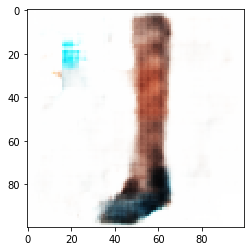

In [0]:
# TODO: INSERT CODE HERE
for i, (x,_) in enumerate(ut_test_loader):
  if i == 1: break
  imgs = x

x, y = imgs[0].unsqueeze(0), imgs[1].unsqueeze(0)
x, y = x.to(device), y.to(device)
x, y = model_vae.encoder(x), model_vae.encoder(y)
x, y = x.view(x.size(0),-1), y.view(y.size(0),-1)
mu_x, log_var_x = model_vae.l1(x), model_vae.l2(x)
mu_y, log_var_y = model_vae.l1(y), model_vae.l2(y)
z_x, z_y = model_vae.reparametrize(mu_x, log_var_x), model_vae.reparametrize(mu_y, log_var_y)

for i in range(11):
  t = 0.1 * i
  z = t*z_x + (1-t)*z_y
  z = model_vae.l3(z)
  z = z.view(-1,6,8,8)
  recon_x = model_vae.decoder(z)

  img = recon_x.data.cpu()[0]
  plt.imshow(img.permute(1,2,0))
  #plt.show()
  plt.savefig(f'interpolation_{i}.png')


In [0]:
# TODO: INSERT CODE HERE
for i, (x,_) in enumerate(ut_test_loader):
  if i == 1: break
  imgs = x

x, y = imgs[0].unsqueeze(0), imgs[1].unsqueeze(0)
x, y = x.to(device), y.to(device)
x, y = model_vae.encoder(x), model_vae.encoder(y)
x, y = x.view(x.size(0),-1), y.view(y.size(0),-1)
mu_x, log_var_x = model_vae.l1(x), model_vae.l2(x)
mu_y, log_var_y = model_vae.l1(y), model_vae.l2(y)
z_x, z_y = model_vae.reparametrize(mu_x, log_var_x), model_vae.reparametrize(mu_y, log_var_y)

gif = []
for i in range(101):
  t = 0.01 * i
  z = t*z_x + (1-t)*z_y
  z = model_vae.l3(z)
  z = z.view(-1,6,8,8)
  recon_x = model_vae.decoder(z)

  img = recon_x.data.cpu()[0]
  img = transforms.ToPILImage()(img)
  gif.append(img)

gif[0].save('interpolation.gif', append_images=gif[1:], save_all=True, duration=200, loop=0)

## Question 4. Generative Models: Generative Adversarial Networks (GAN's) (40 pts)

In this question you will create a Generative Adversarial Network (GAN) for the UT Zappos50K. Before you embark on this part, please read the slides thoroughly to ensure that you understand how the multiple loss functions and general structure of a GAN works. 

GANs are notoriously difficult to train, with each attempt taking a decent amount of time to run. Please start early, as underestimating how much time it takes to train a GAN led many students to not finish on time last year.



**Q4a (0 pts):** Create a normally distributed vector $z$ with $\mu = 0$, $\sigma = 1$ (i.e the np.random.normal default). The vector should have size [batch size, feature length, 1, 1]. You don't need to submit anything for this part. Here feature length describes the length of your vector $z$.


In [0]:
# TODO: INSERT CODE HERE
class UTZdata(Dataset):
  def __init__(self, transform=None):
    self.data = dataset
    self.transform = transform
  def __len__(self):
    return len(self.data)
  def __getitem__(self, idx):
    label = self.data[idx][1]
    label = torch.tensor(label)
    X = self.data[idx][0]
    sample = [X,label]
    if self.transform:
      sample = self.transform(sample)
    return sample

In [0]:
dataset = dset.ImageFolder('/content/DATASETS/UTZappos50K',transform = transforms.Compose([transforms.Resize((64,64)),transforms.ToTensor()]))
UTZ_data = UTZdata()
batch_size = 64
train_loader = DataLoader(UTZ_data, batch_size=batch_size, shuffle=True)

tensor(2)


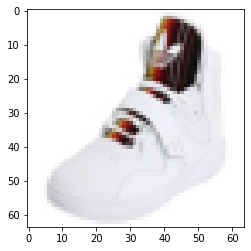

In [19]:
for batch_idx, (x,y) in enumerate(train_loader):
  plt.imshow(x[6].permute(1, 2, 0))
  print(y[6])
  break

def z_vector(batch_size, feature_length= 100):
  z = torch.randn(batch_size, 100, 1, 1, device=device)
  return z

# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

**Q4b (5 pts):** Create the generator network. Use [ConvTranspose2d](https://pytorch.org/docs/stable/nn.html) to upsample the noise vector $z$ to a size of your choosing (512 is what we used but you can/should tune this). Deconvolve it until the number of channels is 3 (so it's RGB), and the output size is (64,64).  In other words, the output of the generator should be [batch size,3,64,64]. Use ReLU and batch norm after every deconvolution and use a sigmoid layer at the end to create your final output. Don't worry about the loss function for now. Describe what your final network looks like in your writeup and why you made these choices.

In [20]:
# TODO: INSERT CODE HERE
class Generator(nn.Module):
  def __init__(self):
    super(Generator, self).__init__()
    self.main = nn.Sequential(
        nn.ConvTranspose2d(100, 512, 4, stride=1, padding=0),  # 512 4 4
        nn.BatchNorm2d(512),
        nn.ReLU(True),
        nn.ConvTranspose2d(512, 256, 4, stride=2, padding=1),  # 256 8 8
        nn.BatchNorm2d(256),
        nn.ReLU(True),
        nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1),  # 128 16 16
        nn.BatchNorm2d(128),
        nn.ReLU(True),
        nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1),  # 64 32 32
        nn.BatchNorm2d(64),
        nn.ReLU(True),
        nn.ConvTranspose2d(64, 3, 4, stride=2, padding=1),  # 3 64 64
        nn.Sigmoid()
    )

  def forward(self, x):
    x = self.main(x)
    return x

netG = Generator().to(device)
summary(netG,(100,1,1))
netG.apply(weights_init)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ConvTranspose2d-1            [-1, 512, 4, 4]         819,712
       BatchNorm2d-2            [-1, 512, 4, 4]           1,024
              ReLU-3            [-1, 512, 4, 4]               0
   ConvTranspose2d-4            [-1, 256, 8, 8]       2,097,408
       BatchNorm2d-5            [-1, 256, 8, 8]             512
              ReLU-6            [-1, 256, 8, 8]               0
   ConvTranspose2d-7          [-1, 128, 16, 16]         524,416
       BatchNorm2d-8          [-1, 128, 16, 16]             256
              ReLU-9          [-1, 128, 16, 16]               0
  ConvTranspose2d-10           [-1, 64, 32, 32]         131,136
      BatchNorm2d-11           [-1, 64, 32, 32]             128
             ReLU-12           [-1, 64, 32, 32]               0
  ConvTranspose2d-13            [-1, 3, 64, 64]           3,075
          Sigmoid-14            [-1, 3,

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): Sigmoid()
  )
)

**Q4c (5 pts):** Create the discriminator network. This should feel very similar to creating a CNN to classify whether an example is in the distribution or not in the distribution. Don't worry about the loss function for this part. Describe what your final network looks like in your writeup and why you made these choices.

In [21]:
# TODO: INSERT CODE HERE
class Discriminator(nn.Module):
  def __init__(self):
    super(Discriminator, self).__init__()
    self.main = nn.Sequential(
        nn.Conv2d(3, 64, 4, 2, 1, bias=False),# (64-4+2*1)/2+1 = 32
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf) x 32 x 32
        nn.Conv2d(64, 128, 4, 2, 1, bias=False),
        nn.BatchNorm2d(128),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf*2) x 16 x 16
        nn.Conv2d(128, 256, 4, 2, 1, bias=False),
        nn.BatchNorm2d(256),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf*4) x 8 x 8
        nn.Conv2d(256, 512, 4, 2, 1, bias=False),
        nn.BatchNorm2d(512),
        nn.LeakyReLU(0.2, inplace=True),
        # state size. (ndf*8) x 4 x 4 -> 1*1*1(195)
        nn.Conv2d(512, 1, 4, 1, 0, bias=False), # (4-4+2*0)/1+1 = 1
        nn.Sigmoid()
    )

  def forward(self, input):
    return self.main(input)

netD = Discriminator().to(device)
summary(netD,(3,64,64))
netD.apply(weights_init)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 32, 32]           3,072
         LeakyReLU-2           [-1, 64, 32, 32]               0
            Conv2d-3          [-1, 128, 16, 16]         131,072
       BatchNorm2d-4          [-1, 128, 16, 16]             256
         LeakyReLU-5          [-1, 128, 16, 16]               0
            Conv2d-6            [-1, 256, 8, 8]         524,288
       BatchNorm2d-7            [-1, 256, 8, 8]             512
         LeakyReLU-8            [-1, 256, 8, 8]               0
            Conv2d-9            [-1, 512, 4, 4]       2,097,152
      BatchNorm2d-10            [-1, 512, 4, 4]           1,024
        LeakyReLU-11            [-1, 512, 4, 4]               0
           Conv2d-12              [-1, 1, 1, 1]           8,192
          Sigmoid-13              [-1, 1, 1, 1]               0
Total params: 2,765,568
Trainable param

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)

**Q4d (4 pts):** Code the loss function for the generator, it should be as follows:

$$ L_G = -\frac{1}{n}\sum_{i=1}^{n}\lg D(G(z))$$

An alternate form for convenince is:
$$ L_G = \frac{1}{n}\sum_{i=1}^{n}L_{CE}(D(G(z)), 1)$$

Where $L_{CE}$ is the cross entropy loss function and n is the batch size. Why is the ground truth label for fake data 1 here? Explain your answer in the write-up.



In [0]:
# TODO: INSERT CODE HERE
real_label = 1
fake_label = 0
criterion = nn.BCELoss()
labels = torch.full((64,), real_label, device=device)

#Calculate loss
def real_loss_(D_out, smooth=True):
  batch_size = D_out.size(0)
  #label smoothing
  if smooth:
    labels = torch.full((batch_size,), real_label*0.9, device=device)
  else:
    labels = torch.full((batch_size,), real_label, device=device) # real labels = 1
  loss = criterion(D_out, labels)
  return loss

def fake_loss_(D_out): 
  batch_size = D_out.size(0)
  labels = torch.full((batch_size,), fake_label, device=device) # fake labels = 0
  # calculate loss
  loss = criterion(D_out, labels) 
  return loss


#generator loss
def generator_loss(d, g, z):
  fake_image = g(z)
  D_fake = d(fake_image).view(-1)
  loss = real_loss_(D_fake)
  return loss

**Q4e (4 pts):** Code the loss function for the discriminator, it should be as follows:

$$ L_D = \frac{1}{2n}\sum_{i=1}^{n}L_{CE}(D(X_i), 1) + L_{CE}(D(G(z)), 0)$$

Where $L_{CE}$ is the cross entropy loss function and n is the batch size. Be sure that you're not normalizing by $n$ twice (if you feed in two vectors into BCELoss, they normalize it by the size of the vector for you).

**Important:** Remember to **detach** your generator when calculating this loss. Think about why this is the case and the repercussions of not doing so. Detail the answer to this question in your write-up.

In [0]:
# TODO: INSERT CODE HERE
def discriminator_loss(d, g, z, img):
  D_real = d(img).view(-1)
  real_loss = real_loss_(D_real, smooth=True)

  fake_image = g(z)
  D_fake = d(fake_image.detach()).view(-1)
  fake_loss = fake_loss_(D_fake) 
  return ((real_loss + fake_loss)/2, real_loss, fake_loss)

**Q4f (2 pts):** Create two optimizers, one for your Discriminator network and one for your generator network. Describe your choices for the learning rate and optimizer in the writeup.

In [0]:
# TODO: INSERT CODE HERE
d_optimizer = torch.optim.Adam(netD.parameters(), lr=0.0002, betas=(0.5, 0.999))
g_optimizer = torch.optim.Adam(netG.parameters(), lr=0.0002, betas=(0.5, 0.999))

**Q4g (20 pts):** Put all of these parts together to create a GAN. The training loop should look as follows:

**Training Loop:**

1.   Create your vector $z$
2.   Zero out the gradient for $G$
3.   Generate your fake image, and calculate $L_G$
4.   Backpropagate $L_G$ and have your optimizer take a step
5.   Zero out the gradient for $D$
6.   Calculate $L_D$
7.   Backpropagate $L_D$ and step your optimizer.

**Hints for training:**

1.   Make sure you're using tensorboard to keep track of the discriminator AND generator losses throughout. Note that if your discriminator loss goes to 0, this represents a failure mode of your training (look at how the generator loss function is calculated and you realize that G's gradients vanish).
2.   Keep vigilant for mode collapse. Display your image after every delta number of iterations to see that not only is your image getting better, but you're also not getting the same image each time. If so, then your network is suffering from mode collapse.
3.   Analyze your generator loss and make sure that it's roughly oscillating around a certain loss. Unlike most other tasks, your generator and discriminator loss are NOT intended to monotonically decrease. Instead they should bounce around a certain loss (see image below for example). Your graph doesn't have to look exactly like this but this is meant to illustrate how the loss should roughly bounce around a certain loss.
![Discriminator Loss](https://i.imgur.com/07JYtA1.png)
![Generator Loss Graph](https://i.imgur.com/NoMFLNg.png)

On the left is the discriminator loss graph, and as you can see, the discriminator loss as a whole goes down but not monotonically. It bounces around signifcantly at each iteration. On the right is the generator graph, whose loss actually increases. Like the discriminator loss graph, you can see that the loss varies significantly from iteration to iteration.


**Hyperparameter Tuning:**

What makes GAN's difficult to train is that they are extremely sensitive to hyperparameters. Some hyperparameters to think about when tuning your GAN:


1.   The number of times you run your discriminator vs. your generator (generally you run your discriminator more times than your generator because the discriminator is what gives your generator feedback).
2.   The learning rate for your discriminator / generator
3.   Your image output size
4.   Your feature vector size (i.e. the length of z)
5.   Your standard neural network hyperparameters (i.e. number of layers, width of layers, batch size, etc.)



There are many sources online that provide help with how to train a GAN -- feel free to look them up! Of course you may not copy code from online sources (please review the collaboration policy) but we encourage you to look up articles online to help debug your GAN. Here are a few examples that we particularly like:

1.   [Keep Calm and train a GAN](https://medium.com/@utk.is.here/keep-calm-and-train-a-gan-pitfalls-and-tips-on-training-generative-adversarial-networks-edd529764aa9)
2.   [Why is it so hard to train GAN's!](https://medium.com/@jonathan_hui/gan-why-it-is-so-hard-to-train-generative-advisory-networks-819a86b3750b)

And many more!

Be sure to start this part early as you will definitely run into issues with training that you wouldn't originally forsee!

After you finish creating your GAN, give us 5 of your best outputs (not all of your results will look reasonable) and plot your training curve for both the generator AND discriminator. Report your final hyper-parameter choices that weren't already reported above (i.e. the batch size, model parameters, etc.)



In [0]:
def generate_images(g, z, rows, cols, name= "generate new image", show= True):
  '''
  Displays the images in a rows * cols grid
  '''
  imgs= g(z)
  imgs= imgs[:rows*cols].cpu().detach()
  #imgs= 0.5* imgs + 0.5
  fig, ax= plt.subplots(rows, cols)
  count= 0
  imgs = np.reshape(imgs, (imgs.shape[0], 3, 64, 64))
  imgs = np.clip(imgs, a_min = 0, a_max = 255) 

  for row in range(rows):
    for col in range(cols):
      img= imgs[count]
      ax[row, col].imshow(img.permute(1, 2, 0))
      ax[row, col].axis('off')
      count += 1
  fig.suptitle(name)
  fig.savefig("%s.png"%(name))
  if(show): 
    plt.show()
  else: 
    plt.close()

[0/5 : 100] G Loss: 3.7447	 D Loss: 0.2805	 D Loss(real): 0.4166	 D Loss (fake):0.1444	
[0/5 : 200] G Loss: 2.0694	 D Loss: 0.5953	 D Loss(real): 0.6335	 D Loss (fake):0.5572	
[0/5 : 300] G Loss: 5.9207	 D Loss: 0.2734	 D Loss(real): 0.5182	 D Loss (fake):0.0285	
[0/5 : 400] G Loss: 1.3943	 D Loss: 0.7488	 D Loss(real): 0.3900	 D Loss (fake):1.1076	
[0/5 : 500] G Loss: 3.6878	 D Loss: 0.3519	 D Loss(real): 0.4595	 D Loss (fake):0.2443	
[0/5 : 600] G Loss: 3.7448	 D Loss: 0.3032	 D Loss(real): 0.5385	 D Loss (fake):0.0679	
[0/5 : 700] G Loss: 4.4075	 D Loss: 0.4073	 D Loss(real): 0.7521	 D Loss (fake):0.0624	


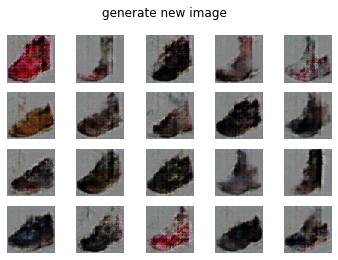

[1/5 : 800] G Loss: 3.0983	 D Loss: 0.2756	 D Loss(real): 0.3786	 D Loss (fake):0.1725	
[1/5 : 900] G Loss: 4.3617	 D Loss: 0.5159	 D Loss(real): 0.9865	 D Loss (fake):0.0453	
[1/5 : 1000] G Loss: 3.5365	 D Loss: 0.3063	 D Loss(real): 0.4945	 D Loss (fake):0.1181	
[1/5 : 1100] G Loss: 3.7437	 D Loss: 0.3414	 D Loss(real): 0.5947	 D Loss (fake):0.0881	
[1/5 : 1200] G Loss: 3.1181	 D Loss: 0.3151	 D Loss(real): 0.4886	 D Loss (fake):0.1415	
[1/5 : 1300] G Loss: 3.1965	 D Loss: 0.4085	 D Loss(real): 0.6855	 D Loss (fake):0.1315	
[1/5 : 1400] G Loss: 1.3959	 D Loss: 0.5257	 D Loss(real): 0.3648	 D Loss (fake):0.6867	
[1/5 : 1500] G Loss: 2.7588	 D Loss: 0.3629	 D Loss(real): 0.4868	 D Loss (fake):0.2390	


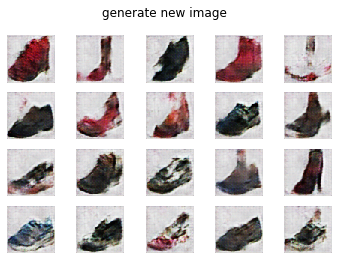

[2/5 : 1600] G Loss: 1.2385	 D Loss: 0.5895	 D Loss(real): 0.3679	 D Loss (fake):0.8110	
[2/5 : 1700] G Loss: 2.8652	 D Loss: 0.4114	 D Loss(real): 0.6362	 D Loss (fake):0.1865	
[2/5 : 1800] G Loss: 1.3472	 D Loss: 0.6168	 D Loss(real): 0.3835	 D Loss (fake):0.8501	
[2/5 : 1900] G Loss: 3.6890	 D Loss: 0.5942	 D Loss(real): 1.0911	 D Loss (fake):0.0972	
[2/5 : 2000] G Loss: 1.2589	 D Loss: 0.5548	 D Loss(real): 0.3774	 D Loss (fake):0.7321	
[2/5 : 2100] G Loss: 1.4707	 D Loss: 0.5064	 D Loss(real): 0.3887	 D Loss (fake):0.6240	
[2/5 : 2200] G Loss: 1.2682	 D Loss: 0.5833	 D Loss(real): 0.3763	 D Loss (fake):0.7903	
[2/5 : 2300] G Loss: 1.1644	 D Loss: 0.5766	 D Loss(real): 0.3663	 D Loss (fake):0.7868	


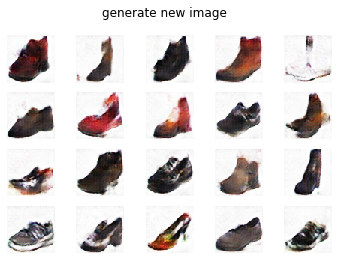

[3/5 : 2400] G Loss: 1.6011	 D Loss: 0.5107	 D Loss(real): 0.4326	 D Loss (fake):0.5888	
[3/5 : 2500] G Loss: 2.8676	 D Loss: 0.5314	 D Loss(real): 0.8970	 D Loss (fake):0.1659	
[3/5 : 2600] G Loss: 2.8181	 D Loss: 0.6210	 D Loss(real): 1.0727	 D Loss (fake):0.1694	
[3/5 : 2700] G Loss: 1.7663	 D Loss: 0.4937	 D Loss(real): 0.5163	 D Loss (fake):0.4711	
[3/5 : 2800] G Loss: 1.5013	 D Loss: 0.5566	 D Loss(real): 0.4422	 D Loss (fake):0.6709	
[3/5 : 2900] G Loss: 2.9072	 D Loss: 0.5039	 D Loss(real): 0.8524	 D Loss (fake):0.1555	
[3/5 : 3000] G Loss: 3.6581	 D Loss: 0.9296	 D Loss(real): 1.7936	 D Loss (fake):0.0657	
[3/5 : 3100] G Loss: 1.8222	 D Loss: 0.5090	 D Loss(real): 0.5395	 D Loss (fake):0.4785	


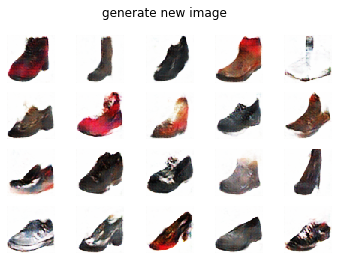

[4/5 : 3200] G Loss: 2.9608	 D Loss: 0.5618	 D Loss(real): 0.9855	 D Loss (fake):0.1381	
[4/5 : 3300] G Loss: 2.9693	 D Loss: 0.5086	 D Loss(real): 0.8697	 D Loss (fake):0.1475	
[4/5 : 3400] G Loss: 2.5599	 D Loss: 0.5141	 D Loss(real): 0.8129	 D Loss (fake):0.2153	
[4/5 : 3500] G Loss: 2.2962	 D Loss: 0.4662	 D Loss(real): 0.6446	 D Loss (fake):0.2879	
[4/5 : 3600] G Loss: 1.9014	 D Loss: 0.4794	 D Loss(real): 0.5156	 D Loss (fake):0.4432	
[4/5 : 3700] G Loss: 1.9803	 D Loss: 0.4457	 D Loss(real): 0.5174	 D Loss (fake):0.3739	
[4/5 : 3800] G Loss: 1.8841	 D Loss: 0.5309	 D Loss(real): 0.6885	 D Loss (fake):0.3734	
[4/5 : 3900] G Loss: 3.0386	 D Loss: 0.6459	 D Loss(real): 1.1396	 D Loss (fake):0.1522	


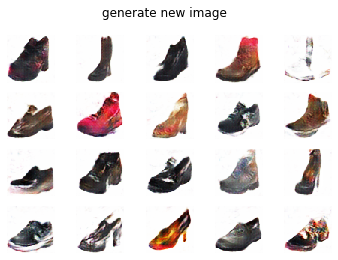

In [26]:
epochs = 15
step = 0
latent_vec = z_vector(64)
logger7 = SummaryWriter('logs/GAN')

for epoch in range(epochs): 
  for i, (X, y) in enumerate(train_loader):
    step= step + 1
    real_images = X.to(device)
    z = z_vector(len(X))

    netG.zero_grad()
    g_loss= generator_loss(netD, netG, z)
    g_loss.backward()
    g_optimizer.step()

    netD.zero_grad()
    d_loss, d_real, d_fake = discriminator_loss(netD, netG, z, real_images)
    d_loss.backward()
    d_optimizer.step()

    if step % 100 == 0: 
      print("[%d/%d : %d] G Loss: %.4f\t D Loss: %.4f\t D Loss(real): %.4f\t D Loss (fake):%.4f\t"
           %(epoch, epochs, step, g_loss, d_loss, d_real, d_fake))
      logger7.add_scalar("G Loss", g_loss, step)
      logger7.add_scalar("D Loss/real",d_real, step)
      logger7.add_scalar("D Loss/fake", d_fake, step)
      logger7.add_scalar("D Loss", d_loss, step)

    if step % 782 == 0:
      generate_images(netG, latent_vec, 4, 5, "generate new image", True)

In [0]:
%tensorboard  --logdir 'logs/GAN'

## Question 5. Least Square GAN (Extra Credit)
The main idea of LSGAN is to use loss function that provides smooth and non-saturating gradient in discriminator 
D


**Q5a (10):** Implement the above GAN model with the follwing objective:
$$\begin{aligned}
&\min _{D} V_{\mathrm{LSGAN}}(D)=\frac{1}{2} \mathbb{E}_{\boldsymbol{x} \sim p_{\mathrm{dnta}}(\boldsymbol{x})}\left[(D(\boldsymbol{x})-1)^{2}\right]+\frac{1}{2} \mathbb{E}_{\boldsymbol{z} \sim p_{\boldsymbol{z}}(\boldsymbol{z})}\left[(D(G(\boldsymbol{z})))^{2}\right]\\
&\min _{G} V_{\mathrm{LSGAN}}(G)=\frac{1}{2} \mathbb{E}_{\boldsymbol{z} \sim p_{\boldsymbol{z}}(\boldsymbol{z})}\left[(D(G(\boldsymbol{z}))-1)^{2}\right]
\end{aligned}$$




**Q5b (5):**Plot the outputs for 10 intermediate stages of training and visulaize the generated outputs for those intermediate stages.

**Q5c (5):**Generate 10 samples using the trained model

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:431: UserWarning: Using a target size (torch.Size([64, 1])) that is different to the input size (torch.Size([64, 1, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


[Epoch 0/3] [Batch 0/782] [D loss: 0.164475] [G loss: 0.876803]
[Epoch 0/3] [Batch 100/782] [D loss: 0.077095] [G loss: 0.605764]
[Epoch 0/3] [Batch 200/782] [D loss: 0.091478] [G loss: 0.460441]
[Epoch 0/3] [Batch 300/782] [D loss: 0.062393] [G loss: 0.549792]
[Epoch 0/3] [Batch 400/782] [D loss: 0.108737] [G loss: 0.483374]
[Epoch 0/3] [Batch 500/782] [D loss: 0.053999] [G loss: 0.773713]
[Epoch 0/3] [Batch 600/782] [D loss: 0.046204] [G loss: 0.617945]
[Epoch 0/3] [Batch 700/782] [D loss: 0.059513] [G loss: 0.729725]


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:431: UserWarning: Using a target size (torch.Size([41, 1])) that is different to the input size (torch.Size([41, 1, 1, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


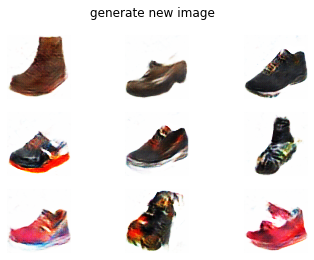

[Epoch 1/3] [Batch 0/782] [D loss: 0.053782] [G loss: 0.796462]
[Epoch 1/3] [Batch 100/782] [D loss: 0.056510] [G loss: 0.610850]
[Epoch 1/3] [Batch 200/782] [D loss: 0.057298] [G loss: 0.639778]
[Epoch 1/3] [Batch 300/782] [D loss: 0.086813] [G loss: 0.585374]
[Epoch 1/3] [Batch 400/782] [D loss: 0.097406] [G loss: 0.424584]
[Epoch 1/3] [Batch 500/782] [D loss: 0.091987] [G loss: 0.809082]
[Epoch 1/3] [Batch 600/782] [D loss: 0.070796] [G loss: 0.519176]
[Epoch 1/3] [Batch 700/782] [D loss: 0.079168] [G loss: 0.815324]


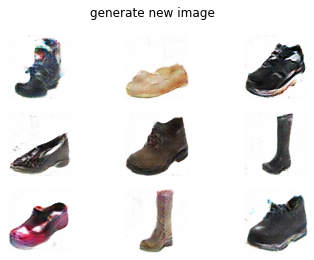

[Epoch 2/3] [Batch 0/782] [D loss: 0.136403] [G loss: 0.299920]
[Epoch 2/3] [Batch 100/782] [D loss: 0.036482] [G loss: 0.726791]
[Epoch 2/3] [Batch 200/782] [D loss: 0.142145] [G loss: 0.798676]
[Epoch 2/3] [Batch 300/782] [D loss: 0.054406] [G loss: 0.588698]
[Epoch 2/3] [Batch 400/782] [D loss: 0.246907] [G loss: 0.942163]
[Epoch 2/3] [Batch 500/782] [D loss: 0.061015] [G loss: 0.572748]
[Epoch 2/3] [Batch 600/782] [D loss: 0.079967] [G loss: 0.652288]
[Epoch 2/3] [Batch 700/782] [D loss: 0.129564] [G loss: 0.716029]


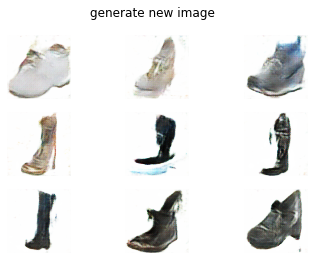

In [27]:
from torch.autograd import Variable
cuda = True if torch.cuda.is_available() else False
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

epochs = 5
step = 0
adversarial_loss = torch.nn.MSELoss()
latent_vec = z_vector(64)

for epoch in range(epochs):
  for i, (imgs, _) in enumerate(train_loader):
    # Adversarial ground truths
    valid = Variable(Tensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)
    fake = Variable(Tensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)

    # Configure input
    real_imgs = Variable(imgs.type(Tensor))

    # -----------------
    #  Train Generator
    # -----------------
    g_optimizer.zero_grad()

    # Sample noise as generator input
    z = Variable(Tensor(torch.randn(imgs.shape[0], 100, 1, 1, device=device)))

    # Generate a batch of images
    gen_imgs = netG(z)

    # Loss measures generator's ability to fool the discriminator
    g_loss = adversarial_loss(netD(gen_imgs), valid)
    g_loss.backward()
    g_optimizer.step()

    # ---------------------
    #  Train Discriminator
    # ---------------------
    d_optimizer.zero_grad()

    # Measure discriminator's ability to classify real from generated samples
    real_loss = adversarial_loss(netD(real_imgs), valid)
    fake_loss = adversarial_loss(netD(gen_imgs.detach()), fake)
    d_loss = 0.5 * (real_loss + fake_loss)

    d_loss.backward()
    d_optimizer.step()
    if i%100 == 0:
      print("[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
        % (epoch, epochs, i, len(train_loader), d_loss.item(), g_loss.item()))
  generate_images(netG, z, 3, 3, "generate new image", True)

## Submission Instructions

The deadline for all parts of this assignment is **March 5, 2020 at 11:59pm**.

There are two submissions on Gradescope:
*   HW3 - Computer Vision (Writeup)
*   HW3 - Computer Vision (Programming)

For *HW3 - Computer Vision (Writeup)* submit your written responses to the questions above as the file **"522_HW3_writeup.pdf"**

For *HW3 - Computer Vision (Programming)* submit the following files as your submission:
1.   522_HW3_submission.dill
2.   This notebook, named as 522_HW3_notebook.ipynb

**Leaderboard:** When you submit, you can choose to add yourself as part of the leaderboard! Extra credit may be awarded to those that perform particularly well on the leaderboard.

**Gradescope Score:** After you submit, you'll see that all of the classifier questions are out of zero points. To encourage as much hypertuning, we will not be releasing the accuracy cutoffs until after the late deadline has passed.

In [0]:
import dill
import os

file_to_obj_map = {
    'test_case_1b' : test_case_1b,
    'test_case_1c' : test_case_1c,
    'test_case_1d' : test_case_1d,
    'test_case_2a' : test_case_2a,
}

tests_path = "522_HW3_submission.dill"
with open(tests_path, 'wb') as pickle_file:
  dill.dump(file_to_obj_map, pickle_file)